In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")

In [3]:
data = pd.read_csv("ner_dataset.csv", encoding="latin1")
data = data.drop(['POS'], axis =1)
data = data.fillna(method="ffill")
data.tail(12)

,Sentence #,Word,Tag
1048563,Sentence: 47958,exploded,O
1048564,Sentence: 47958,upon,O
1048565,Sentence: 47958,impact,O
1048566,Sentence: 47958,.,O
1048567,Sentence: 47959,Indian,B-gpe
1048568,Sentence: 47959,forces,O
1048569,Sentence: 47959,said,O
1048570,Sentence: 47959,they,O
1048571,Sentence: 47959,responded,O
1048572,Sentence: 47959,to,O


In [4]:
words = set(list(data['Word'].values))
words.add('PADword')
n_words = len(words)
n_words

35179

In [5]:
tags = list(set(data["Tag"].values))
n_tags = len(tags)
n_tags

17

In [6]:
class SentenceGetter(object):
    
    def __init__(self, data):
        self.n_sent = 1
        self.data = data
        self.empty = False
        agg_func = lambda s: [(w, t) for w, t in zip(s["Word"].values.tolist(),s["Tag"].values.tolist())]
        self.grouped = self.data.groupby("Sentence #").apply(agg_func)
        self.sentences = [s for s in self.grouped]
    
    def get_next(self):
        try:
            s = self.grouped["Sentence: {}".format(self.n_sent)]
            self.n_sent += 1
            return s
        except:
            return None

In [7]:
getter = SentenceGetter(data)
sent = getter.get_next()
print(sent)

[('Thousands', 'O'), ('of', 'O'), ('demonstrators', 'O'), ('have', 'O'), ('marched', 'O'), ('through', 'O'), ('London', 'B-geo'), ('to', 'O'), ('protest', 'O'), ('the', 'O'), ('war', 'O'), ('in', 'O'), ('Iraq', 'B-geo'), ('and', 'O'), ('demand', 'O'), ('the', 'O'), ('withdrawal', 'O'), ('of', 'O'), ('British', 'B-gpe'), ('troops', 'O'), ('from', 'O'), ('that', 'O'), ('country', 'O'), ('.', 'O')]


In [8]:
sentences = getter.sentences
print(len(sentences))

47959


In [9]:
largest_sen = max(len(sen) for sen in sentences)
print('biggest sentence has {} words'.format(largest_sen))

biggest sentence has 104 words


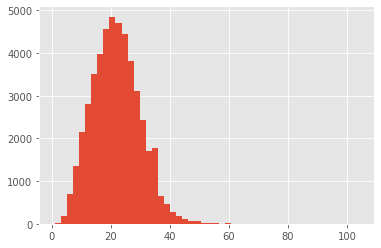

In [10]:
%matplotlib inline
plt.hist([len(sen) for sen in sentences], bins = 50)
plt.show()

In [12]:
max_len = 50
X = [[w[0]for w in s] for s in sentences]
new_X = []
for seq in X:
    new_seq = []
    for i in range(max_len):
        try:
            new_seq.append(seq[i])
        except:
            new_seq.append("PADword")
    new_X.append(new_seq)


In [28]:
for i in new_X :
    print(i)
    

['Thousands', 'of', 'demonstrators', 'have', 'marched', 'through', 'London', 'to', 'protest', 'the', 'war', 'in', 'Iraq', 'and', 'demand', 'the', 'withdrawal', 'of', 'British', 'troops', 'from', 'that', 'country', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Iranian', 'officials', 'say', 'they', 'expect', 'to', 'get', 'access', 'to', 'sealed', 'sensitive', 'parts', 'of', 'the', 'plant', 'Wednesday', ',', 'after', 'an', 'IAEA', 'surveillance', 'system', 'begins', 'functioning', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', '

['Zawahiri', 'stressed', 'that', 'Western', 'leaders', 'should', 'be', 'more', 'concerned', 'about', 'attacks', 'in', 'the', 'Gulf', 'or', 'Israel', 'than', 'violence', 'in', 'Iraq', 'or', 'Afghanistan', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Pope', 'John', 'Paul', 'II', 'has', 'included', 'prayers', 'for', 'the', 'victims', 'of', 'the', 'Asian', 'tsunami', 'in', 'his', 'New', 'Year', "'s", 'Day', 'Mass', 'marking', 'the', 'Roman', 'Catholic', 'Church', "'s", 'annual', 'World', 'Day', 'of', 'Peace', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Thousands', 'of', 'pilgrims', 'atten

['The', 'offer', 'of', 'reverse', 'sterilization', 'surgery', 'comes', 'as', 'Chinese', 'authorities', 'block', 'access', 'to', 'schools', 'destroyed', 'by', 'the', 'quake', 'in', 'an', 'apparent', 'effort', 'to', 'quell', 'demonstrations', 'by', 'angry', ',', 'grieving', 'parents', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['But', 'analysts', 'predict', 'that', 'no', 'party', 'will', 'win', 'an', 'outright', 'majority', ',', 'and', 'that', 'a', 'coalition', 'of', "Shi'ites", 'and', 'Kurds', 'will', 'likely', 'govern', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['The', 'dir

['Turkish', 'security', 'officials', 'say', 'Kurdish', 'rebels', 'have', 'killed', '13', 'Turkish', 'soldiers', 'in', 'a', 'southeastern', 'province', 'near', 'the', 'border', 'with', 'Iraq', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Malik', 'is', 'the', 'chief', 'of', 'the', 'Jammu-Kashmir', 'Liberation', 'Front', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword'

['In', 'June', '2005', ',', 'the', 'National', 'Parliament', 'unanimously', 'approved', 'the', 'creation', 'of', 'a', 'Petroleum', 'Fund', 'to', 'serve', 'as', 'a', 'repository', 'for', 'all', 'petroleum', 'revenues', 'and', 'to', 'preserve', 'the', 'value', 'of', 'Timor-Leste', "'s", 'petroleum', 'wealth', 'for', 'future', 'generations', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['The', 'Fund', 'held', 'assets', 'of', 'US', '$', '6.6', 'billion', 'as', 'of', 'October', '2010', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['The', 'economy', 'c

['If', 'Hezbollah', 'is', 'responsible', 'for', 'placing', 'explosives', 'in', 'recent', 'days', ',', 'it', 'would', 'mark', 'a', 'violation', 'of', 'a', 'U.N.-brokered', 'ceasefire', 'agreement', 'declared', 'last', 'August', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Israeli', 'media', 'say', 'Adam', 'had', 'several', 'disagreements', 'with', 'the', 'army', 'chief', ',', 'Lieutenant', 'General', 'Dan', 'Halutz', ',', 'over', 'the', 'conduct', 'of', 'the', 'war', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
[

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['The', 'U.S.', 'military', 'often', 'refers', 'to', 'mortar', 'and', 'rocket', 'attacks', 'as', '"', 'indirect', 'fire', '"', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Violence', 'in', 'the', 'region', 'has', 'dropped', 'sharply', 'since', 'coalition', 'and', 'Iraqi', 'forces', 'moved', 'to', 'take', 'control', 'of', 'Basra', 'from', "Shi'ite", 'militias', 'last', 'year', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PAD

['Switzerland', 'and', 'Russia', 'have', 'skated', 'to', 'the', 'quarterfinals', 'of', 'the', 'men', "'s", 'Olympic', 'ice', 'hockey', 'tournament', 'at', 'the', 'Turin', 'Games', 'in', 'Italy', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['The', 'Swiss', 'played', 'Group', 'A', 'rival', 'Germany', 'to', 'a', 'two-goal', 'draw', '(', '02-Feb', ')', 'Sunday', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['

['Sam', 'Beattie', 'reports', 'from', 'Beijing', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['His', 'latest', 'album', ',', 'Time', 'Was', '-', 'Time', 'Is', ',', 'was', 'nominated', 'for', 'a', 'Grammy', 'this', 'year', 'for', 'Best', 'Latin', 'Jazz', 'Album', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', '

['The', 'European', 'Union', 'has', 'been', 'negotiating', 'with', 'Iran', 'to', 'halt', 'uranium', 'conversion', 'that', 'can', 'lead', 'to', 'high-grade', 'nuclear', 'fuel', 'for', 'atomic', 'weaponry', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['However', ',', 'the', 'Europeans', 'canceled', 'further', 'talks', 'set', 'for', 'August', '31', ',', 'after', 'Tehran', 'resumed', 'uranium', 'conversion', 'activities', 'earlier', 'this', 'month', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['The', 'director', 'of', 'China', "'s", 'Taiwan', 'Affairs', 'Office', 'made', 'the', 'announcement', 'in', 'Beijing', 'at', 'the', 'end', 'of', 'a', 'government', 'forum', 'on', 'cross-straits', 'business', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Agriculture', 'accounts', 'for', 'little', 'more', 'than', '1', '%', 'of', 'GDP', 'and', 'of', 'employment', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword',

['Some', 'EU', 'countries', 'are', 'skeptical', 'if', 'such', 'inoculations', 'can', 'ward', 'off', 'the', 'deadly', 'virus', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Bird', 'flu', 'has', 'killed', 'more', 'than', '90', 'people', 'since', '2003', 'in', 'Asia', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword'

['Speaking', 'in', 'the', 'Mexican', 'state', 'of', 'Sonora', 'Tuesday', ',', 'Mr.', 'Fox', 'said', 'the', 'crime', 'along', 'the', 'border', 'is', 'the', 'shared', 'responsibility', 'of', 'both', 'governments', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Mr.', 'Fox', 'issued', 'his', 'call', 'after', 'the', 'governors', 'of', 'two', 'U.S.', 'states', ',', 'Arizona', 'and', 'New', 'Mexico', ',', 'declared', 'states', 'of', 'emergency', 'along', 'their', 'border', 'with', 'Mexico', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['Both', 'Janet', 'Napolitano

['Suspected', 'U.S.', 'drones', 'fired', 'missiles', 'at', 'several', 'suspected', 'militant', 'hideouts', 'in', 'Pakistan', "'s", 'North', 'Waziristan', 'tribal', 'region', 'Tuesday', ',', 'killing', 'at', 'least', '16', 'people', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword']
['North', 'Waziristan', 'is', 'known', 'as', 'a', 'base', 'for', 'the', 'Taliban-allied', 'Haqqani', 'group', ',', 'which', 'is', 'blamed', 'for', 'cross-border', 'attacks', 'against', 'U.S.', ',', 'NATO', 'and', 'Afghan', 'troops', 'in', 'Afghanistan', '.', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword', 'PADword'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
tags

['B-geo',
 'B-org',
 'B-tim',
 'I-gpe',
 'I-org',
 'B-per',
 'I-nat',
 'I-eve',
 'I-art',
 'I-per',
 'B-nat',
 'I-tim',
 'O',
 'I-geo',
 'B-eve',
 'B-gpe',
 'B-art']

In [26]:
from keras.preprocessing.sequence import pad_sequences
tags2index = {t:i for i,t in enumerate(tags)}
y = [[tags2index[w[1]] for w in s] for s in sentences]
for i in y:
    print(len(i))
    break
y = pad_sequences(maxlen=max_len, sequences=y, padding="post", value=tags2index["O"])
for i in y:
    print(len(i))
    break

24
50


In [21]:
for i in y :
    print(i)

[12 12 12 12 12 12  0 12 12 12 12 12  0 12 12 12 12 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12  1 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 12 12 12 12  0 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12
 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  5  9 12  2 12  0 12 15 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12
  5 15 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  0 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 15 12  5  9 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12  2 11 12  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12 12  2 11 11 11 12 12 12 12 12 12  2 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12 12 12 12  2 11 11 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12  0 12 12 12 12 12 1

 12 12]
[12  0 12 12  0 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12  5
  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 16 12 12 12 12  2 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12  2
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12  2
 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  5  9  9  9 12  5  9 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12
 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12  0 12 15 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12  0 13 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12  0 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12  0 13 12  1  4  4  4 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12  1 12 12  2 12 12 12 12 12 12 12 12 12 12  0 12 12 12 1

[ 5  9  9  9 12 12 12 12 12  5  1 12 12 12 12 12 12 12  2 12 12 12 12 12
  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1 12 12 12 12 12 12  0 12 12 12 12 12 12 12  1  4  4 12 12
 12 12 12 12 12 12 12 12  2  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12
 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12  5  9  9 12 12 12  1 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 15 12 12 12 12 15 12  2 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 15 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 15 12 12  0 13 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  5 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  5  9 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12  0 12 12 12 12 12 12  2 12 12 12 12 12  1  4  4  4 12 12 12  1
 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  1 12 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12  2 12 12  1  4 12 12  0 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 1

[12  1  4 12 12 15 12 12 12 12 12 12 15 12 12  1  4  4 12 12 12 12 12 12
 12 12 15 12 12 12 16  8 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
  0 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12  0  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12
 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4  4 12 12
 12  2 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  5  9 12 12 12 12 12 12 12 12 12 12  0 13 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 12 12 12 12 12  0 12 12 12 12 12  5  9 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[12 12  0 13 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12  5  9 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12  1 12 12 12 12 12  5  9  9 12 12 12 12 12 12 12
 12 12 12 12 12 12 12  0 13 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12  0 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12
  1  4  4 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12  0  2 12 12 12 1

 12 12]
[12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 15  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  5  9 12  0 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12  5  9 12 12 12 12  0 12  0 12  0 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 12 12 12  0 12 12 12 12 12 12 12  1  4  4 12  0 12  

 12 12]
[12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  5  9  9 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[12 12 12 12 12  2 12 12 12 12 12  0 12  0 13 13 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  5  9
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5  9 12 12 12 12 12 12  1 12 12 12 12 12 12  0 12 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 13 12 12 12  2 11 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12
 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  0 12 12 12 12 12 12 12 12  0  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12 12 12 12 12  0  2 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12  2 12  5  9 12 12 12 15  5  9  9 12  2 11 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2
 12

 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12 12 12 12  0 12  0 12 12  1  4  4 12 12 12 12  1 12 1

 12 12]
[12  2 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12  2 11 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12  0 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12  5  9 12 12  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1  4  4  4 12 12 12 12 12 15 12  2 11 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1  4  4 12 12 15 12 12 12 12 12 12 12  1 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 15 12 12  0 12 12 1

 12 12]
[ 1 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12  0 13 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 13 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 13 12  5  9  9 12 12 12 12 12 12 12 12 12 12  1 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9  9  9 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1  4  4  4  4 12 12 12 12 12 12 12 15 12 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12  0 12  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12 12  

[12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12
  0 13 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12  5  9 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12  0 13 12  5  9 12 12 12 12 12 12 12  0 12  0 12 12  5  9 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12  5  9 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12  5  9 12 12 12 15  5  9  9 12 12 15 12 12 12 12 12 12 12 1

 12 12]
[15  5  9  9 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 15 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15  5  9  9  9 12 12  5 12 12 12 12 12  1 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 15  3 12 12 12 12 12 12 12  2 11 11 11 11 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  5  9 12 12 12 12 12  1  4  4  4  4 12 12 12 12 12  0 13 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12  0 12 12 12 1

[12 12 12 12  2 12 12 12 12  2 12 12  1 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 14  7  7 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 14  7  7 12 12 12 12 12 12  2 12 12  1  4 12  2
 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12  2 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5  9 12 12 12  1  4 12 12  5 12 12 12 12 12
  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  2 12  2 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 11 11 12  1 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 13 12 12 12  5  9  9 12 12  0 13  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9  9 12  2 12 12 12 12 12 12 15  5  9  9 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4  4 12  0 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  4  4 12 12 12 12 12 12 12 12  0 12 15 12 12 12 12 12 12 1

[12 12 12 12 12 12  1 12  1 12 12 12 12 12 12 12 12  0 12  0 13 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  1  4  4  4 12 12  1 12 12 12  0 12 12 12  0 12 12
 12 12 12  0 12  0  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12
  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12  2 12 12  1  4 12 12 12 12  0 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12  1 12  0 13 13 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12  0 12  0 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12  5  9  9  9 12  2
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12  5  9 12 12 12 12 12
  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 11 12  0 13 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5 12  5  9 12 12 12 12 12 12 12 12 12 1

[12 12 12  5  9 12 12 12 12 12 12 12 12 12  0 12  0 12 12 12 12 12 12  1
  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1  4 12 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12  1  4  4  5  9 12 12 12 12  1  4  4 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[ 5  9 12 12 12 12 12 12  0 12 12 12 12 12  0 12 12 12 12 12 12 12 12  5
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15 12 12 12 12 12 12 12 12 12 12 12  0 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 15 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 15 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12  2 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[15 12 12 12 12  0 12  2 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 11  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  2 11
 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 16  8 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 16  8 12 12 12 12  1  2
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12  0 13 13 13 13 13 12  0 12  1  4  4 12  0 13 13 12  0
 13 13 12  0 13 13 13 12  0 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 1

[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 15  5 12  5  9 12 12 15 12  5  9 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12  5  9  9  9  9 12 12 12 12 12 12
 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 15 12 12 12  0 12 12 12 12 12 12  5 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4 12 12 12 15
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  0 13 12  2 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12  2 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12  2 12  0 12 12 12 12  1  4 12 12 12 12 12  5  9  9 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12  1  4 12 12  0 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 15  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4 12 12 12  1  4 12  1  4 12 12 12 12 12 12  0 12 12 12 12 1

 12 12]
[ 1 12 12 12 12 12  2 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12  0 13 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12  1  4  4  4 12  0 12  0 12 12 12 12  1  4 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12  5  9 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12  1  4  4 12  5 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12  5 12  5  9
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 13 12 12 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12  5  9 12 1

 12 12]
[12 12 15 12 12 12 12 12 12  0 12 12 12 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5  9  9 12  2 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 15 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 15 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4 12 15 12 12 12 12  5  9 12 12 12 12 12  0 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12  1 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12  5 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 15 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 13 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12  0 13 13 12 12 12 1

 12 12]
[ 1 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12  1  4 12 12  2 12  0 13 12  5  9 12 12 12 12 12 12  0 12 12
 12 12  5  9 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 14  7 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12  0 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12  1  4  4  4 12 12  0 13 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12  0  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 13 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  5  9  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  1  4 12 12 12  0 12  0 13 12  5  9 12 12 12 12 12 12 12 12 12 12 12
  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 1

 12 12]
[12 12  2 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12  0 12
 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12  1
  4 12]
[12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12  0 13 12  0 13 12
 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4 12  1 12  1 12 12  0 13 13 12  0 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12  5  9 12  0 12 12 12 12 12 14  7 12 12 12  0 13 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12  5  9 12 12 12 12 12 12 12 12 12  0 12  5  9 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12  0 12 12 12  2 12 12 12  0 12 12 12 12 12 12 12 12 12  0
 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12  0 12  5  9 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12  0 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 13 13 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 16 12 12 12 15 12 16 12 12 12 12 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 16 12 16 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 1

[ 2 12  1 12  5  9 12 12  5  9 12 12 12 12 12 12 12  1 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12  0  2 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12
 12 15 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12  2 12 12 12 12 12 12 12 12 12 12 12
  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1  4  4  4  4 12  1  5  9 12 12  2 12  2 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4  4
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5 15 12 12  1  4 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12  1  4  4 12 12 15 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12  1  4 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 15  5  9  9 12 12 12 12 12 12 15 12 12 12 12
 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12  0 13
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12  2 11 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  0 13  2 11 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  1  4  5 12 12 12 12 12 12 12 12 12 15 12 12 1

 12 12]
[12 12 15 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0  2 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 12 12 12  2 12 12 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12  

 12 12]
[12  1  4  4 12  5  9 12 12 12 12 12  5  9 12 12 12 12 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 12 15 12 12  1 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12  1 12  1  4  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12  0 12 12 12 12 12 12 15 12 12 12  5  9 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  1 12  1  5  9 12 12  0 12 12 12
 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12  5  9 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 1

[ 5  9 12 12  1  4 12 12 12 12 12 12 12 12  0 12 12  2 12 12 12 12 12 12
  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1 12 12 12 12 12 12  1  4  4 12 12  1  4 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12  1 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  1  4 12 12 12  0 13 13 12 12 12  1  4 12 12  1  4 12
  0

[12  1  4  4 12  1  4 12 12 12 12 12 12 12 12  0 12  2 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  1  4 12 12  1  4  4  4  4  4 12 12 12 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 13
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  5  9  2 12  0  5 12  1  4 12 12  5  9 12 12 12 12 12 12 12 12
 12

[12 15 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 15 12 12 12 12 12 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 12 12 12  0 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12 12  1  4  4  4 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12
 12

[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12  0 12 12 12 12 12 15 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12  1 12  2 12  5  9 12 12 12 12 12 12 12 12 12 12
 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  5  9 12 12  0 13 13 12  5  9 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12  2 12 15  5 12  5  9 12 12 12  0 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12  5 12  5  9 12  2 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12  1 12 12 12 12 12 12 12 12 12  2 11 12 12  1 12  0 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12
 12 12]
[15 12 12 12 12 15 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[ 5 12 12 12 12 12  2 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  1 12  2 11 12 12 12 12 12  1  4 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12
  0 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12  2 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1  4  4  4 12  0 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12  0 12 12  1 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  2 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12 12 12 12 12 12 12  2 11 12  1  4 12 12 12 12 12 12 12
 12

 12 12]
[12  0 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12  0 12 12 12 12 12  2 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 1 12 12 12  5  9  2 12 12 12 12 12 12 12  1 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12  5  9  9 12  0 13 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5  9  9 12 12 12 12 12 12 12 12 12  2 11 11 11 12 12 12 12  2 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1  4 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  

 12 12]
[12 12 12  0 12  1  4  4 12 12 12 12  1  4  4  4  4 12 15  3 12 12  1  4
  2 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12 12 12  1 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 15  3 12 12 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1 12 12 12 12 12 12 12 12 12 12  1  4  4 12 12 12 12 12 12 12
 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 2 12  5 12 12 12 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12  0 12 12 12 12 12 12  5  9  9  9  9  9 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  3 12 12  2 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  5  9 12 12 12 12 15  0 12  0 13 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  3 12 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12  0 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 10 12 12 12 12  1 12  1  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12  5  9 12 12 15 12 12 12 12 12  0 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1  4  4 12 12 12 12 12 12  1  4  4  4 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12  5  9 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12 12 12 12 12 12 12 12  0 12  5  9 12 15  5  9  9  9 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12  2 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12  5 12 12  5  9 12 12  5  9 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  5
 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12  0 12 12 12  1  4  4 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15  1 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 15 12 12 12 12  2 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12  0 12 12 15 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12  0 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12  0 13 12  2 12 12 15 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1 12 12 12 12  5  9 12  2 12  1 12 12 12 12 12 12 12 1

 12 12]
[ 1 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1 12  5  9 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 15 12 12  0 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12  1 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 15 12 12 12 12 12 12 15 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 1

 12 12]
[ 5 12 15 12 12  1  4 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12  1 12 12 12 12 12 12 12  2 11 11 11 11 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12 12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12  2 12 12 12 12  0 13 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12  0 12  0 13 12  0 12 12 12 12  2 11 12 12 12 12 12 12 1

[12 12 12 12 12 12 12 12 12 12 12  0 12  0 13 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12  1 12 12 12 12  1  4 12 12 12  0 12 12  0 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12
 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4 12  2 12 12  0 12 12  5  9 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1  4 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12  1 12
  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12  2 12 12 15
 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12  2 11 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4  4  4  4 12  0 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12  0 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12  0  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12  0 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12  5  9  9  9 12 1

[12 12 12 12 12 12 12 12  2 11 12 12 12 12  5  9  9 12 12 15 12  2 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 11 11 11 12 12  2 12  2 11 11 11 11 11 12 12 12 12 12  1 12 12
 12 12 12 12 12 12  1 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  0 12 12 12 15  1 12 12 12 12  1  4 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12  0 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 15 12 15 12 12 12 12 12 12 12  0 13 13 12 12 12 12 12  2 11
 12

 12 12]
[12  5 12 12 12 12 12 15  5  9  9 12 12 12 12  0 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  3 12 12 12  1  4 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4  4  4 12  1  4 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12  0 12 12 12 12 12 12 12 12  5 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  5 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  3 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  3 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12  2 12  0 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12  0 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12  1  4 12  1
  4  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[ 5  9 12 12  5  9 12 12 12  1  4  4  4 12  0 13 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5 12 12 12 12  2 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12  2 11 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  1 12  5  9 12 12 12 12 12 12 12 12 12  2 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[12  5  9  9  9 12 12  0  5  9  9 12 12 12 15 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1  4  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12  5  9 12 12 12 12 12 12 12  1  4  4  4 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 15 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 15 12 12 12 12 12 12  0 13 12  0 13 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12  1  4  4 12 12 15 12  5  9 12  2 12  0 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[ 2 12  1 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12  0 12  0 13 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12  2 12  0 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  5  9 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12  0 12 12 12  0 13 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  5  9  9 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 12  5  9 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12  1  4  4  4 12 12 12 12 12 12 12 12  2 11 11 11 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4 12 12 12  2 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  1  4  4 12  1 12 12 12 12 12 12 12 12
 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9  9 12  1 12  2 12 12 12 12 12 12 12 12 12 12 12  0 12 12 1

 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 10 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[ 5  9 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  0 12 12 12  5 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12  0  2 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12  0 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 1

 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12  2 1

[ 5  9  9  9 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 15 12 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[12 12 12 12 12 12 12  1 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12  5 12 12 12 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12  5 12 12 12  2 11 12 12 12 12 12 12 12 12 15 12 12 12 12
 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0  5  9  9 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12  0 12 12 12 12  0 13  5  9 12  1 12  5  9 12  1  4  4  5
  9

 12 12]
[12  5  9 12  5 12 12 12  0 12  2 12 12  5 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1  4  4  4 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12  1 12 14 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12  0 12  0 12 1

[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1  2 11 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  0 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12 12 12  2 12 12 12 12  2 11 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12  0 12 12 12  2 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 15 12 12 12 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12  2 11 11 11 11 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12  0 12 12  0 12 12 12 12 12 12  0 13 12 12 12
 12 12 12  0 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  1 12 12  2 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12  0 13 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 15 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12  5
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12  1  4  4  4
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  5  9 12 12 12 12 12 12  1  4  4 12  1 12 12 12 12 12 12 1

[15  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12  0 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 15  5  9  9 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12  5  9 12
 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12  1  4  4  4 12 15 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12
 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  5 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12  5 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[ 1  4  4  4  5  9 12 12 15 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12  1  4  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5 12 12 12 12 12 12 12 12 12 15 12 12  0 12 12 12 12 12 12  

[ 1  4 12 12 12 12 12  1  4 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  1  4  4  4  5  9 12 12 12 12 12 12 12 12 12 12
 12 12 12 12  2 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12  2 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12  1 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  1 12 12  2 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12  0 13 13 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[15 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12  5 12  5  9 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12  1  4  4  2 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12  1 12 12 12 12 12 12 12 12 12 12 12  0 12  2 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 15  5  9  9  9 12 15  5  9  9  9 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 15 12 12  0 12 12
 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12  1  4  4 12  5  0 12  0 12  2 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  0 12 12 12 12 12 12 12 12 12 15  5  9  9 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  0 12 12 12 12 12  0 12 12 12 12 15 12 12 12 12 12 12 12 12  2
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  1  4  4 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  0 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 13 12  0 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0  2
 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 15 12 12 15 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 1

[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 15 12 12  0
 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12

[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12  5  9
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12  2 12  5  9  9  9 12 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12  0 13 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  5  9  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  5  9 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12  5 12 12 12 12 12 12 12  1  4  4 12  0 13 12 12  0 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  1  5  9 12 12 12 12 12  0 12 12 12 12  5  9 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12  5  9 12 12  

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 1

 12 12]
[12  1  4  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12  2 11 12 12  0 13 13 12 12 12 12 15 12 12 15 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 15 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5 12 12 12 12 15 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 1

 12 12]
[ 2 12 12  1  4 12 12 12 12 12 15 12  5  9 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 15 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12 12 12  5  9 12 12 12 12 12  0 12 12 12 12 12 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4 12 12  1 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12  1  4 12
 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 15 12 12 12 12 12 12  2 12 12 15 12 12 12 12 1

 12 12]
[15 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12  0 12 12 12 12 12  0 13 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12  1 12  1  0 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12  1 12 12 12 12 12 12 12 12 12  5  9  9 12
 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  0 13 12  2 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[ 5  9 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  1  4  4 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12  0 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 13 12  0 12  0 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 13 12 12  0 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1  5  9  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12  1 12 12 12 12  5  9 12 12 12 12 12 12  1  4 12 12 12  1  4  4
  4 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  5  9  9 12  0 12 12 12 12 12 12 12 15 12 15 12 12 12 12 12 12 12
 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  0 12  5 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  5  9  9  9 12 12 12 12 12  0 13
 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15 12 12 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12  0 13 12 12 12 12 12 15 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12  1 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12  5  9  9  9 12 12 12  0 12 12 12 12 12 12 12  2 11
 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12 12  1  4 12 12 12 12 12  0 12 12 12  5  9  9  9 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  5  9 12 12 12 12 12  5 12 12 12 12 12
 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12  1  5  9 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5 12 12 12 12 12  0 12 16 12 12 12 12 12 12 12 12  5  9  9 12 12 12 12
  0 12 12 12  5  9  9 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12  0 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 1

[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12  5  9 12 12
 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 15 12 12  0  2 12  5  9 12 12 12 12 12 12 12 12 12  1  4
 12

[12  2 11 12  0 12 12 12 12 12 12 12 12  2 12 12  0 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 12 12  0 12 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12  0 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  5  9 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 15 12 12 12  2 12 12 12 12 12 15 12 15 12
 12

 12 12]
[12  1  4  4 12 12 12 12 10 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 15 12 12 12 12  2 12 12 12 12 12 12 12  0 12 12 12 12 1

[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  0 12 12  1  4 12 12  5  9 12 12 12  0 12 12 12 12  5  9 12 12
 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  2 11 11 11 11 12 12 12 12 12 12 12 12 12
 12

 12 12]
[ 1  4 12  5  9 12 12  0 13 12 12 12 12 12 12  1  4 12 12 12 12  2 11 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  1 12 12 12 12 12  1 12  1 12 12 12 12 12  2 12  2 11 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12  1  4  4 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  4 12  1  4 12 12 12  5  1 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12  0 1

 12 12]
[12 12  1  4  4  4 12 12 12 12 12 12 12 12 12 12 12  2 11 11 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12  0 12 12 12 12 12
  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 12 12 12  5  9 12 12 12 12  2 11 12 12 12  0 13 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12  2 11  0 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 10  6 12 10 12 12 10 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12

 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12  0 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  1 12  2 11 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 11 11 11 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12  5  9 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12  0 15 12 12 12 12 12 12  2 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1 12 12 12 12 12 12  2 12 12  1  4  4  4 12  0 12 12  2
 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12 12  2 11 12 12  0 13 12  0 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12 12 12 12  0 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12  0  2 11 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4 12  5  9  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12
 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12  2 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9 12 12 12 12  5  9 12 12 12 12 12 12  2 12 12 12 12 12 12 12  0
 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  2 12  2 11
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4 12 12 12  0 12 12 12 12 15 12 12  2 12 12  0 13 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12  1  4 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 15  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12  5 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12  0 13 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[12  0 13 12  0 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12  2
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12  0 13 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  2 11 11 11 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  0 13 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1  4  4  4 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0  1  4  4 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12  0 13 12 12 12 12  1  4  4 12  2 12 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12  5  9  9  9 12 12 12 12 12 12 12 12 12  0
 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12 12 12 1

 12 12]
[12  0 12 12 12 12 12  0 12 12 12 12 12 12 12  1 12  5  9  9 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 12  5  9  9  9  9 12 12 12 12  5  9 12 12 12 12  2 11 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  5  9 12 12 12 12  5  9 12 12 12 12  0 12 12 12 12 12 12 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12 12 12 12 12 12  5  9 12 12 12  2 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12  0 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12  0 12 12 12 12 12 12 15 12 12  2 12 12 12 15 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 15 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12  5  9  9 12  0 12 12 12 12 12  1  4  4 12 1

[ 1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12  0 12  0 12 12 12 12 12 12 12 12 12 15
 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12  0 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  5 12  5  9 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  2 12 12 12 12 12  5  9 12  2 12 12 12  5  9 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12  0 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12  5  9  2 12 12 12 12 12 12 12  0 12 12 12 12 12 12  0
 12 12  2 12  1  4  4  4  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12  0 13 12 12 12 12 12  2 12 12 12  1 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12  0 13 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 15 12 12  0 12 12 12 12 12 12 12  2 12 12 12 12 12 12  0
 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 1

 12 12]
[12 12  0 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12  0 12 12
 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12  0 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12  1  4 12 12 12 12 12 12 12  0 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  2 12 1

 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

[12 12 12 12 12 12 12  2 11 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12 12 12 12 12  5  9 12  0 12  2 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[12 12 12 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 15 12  5  9  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  0 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  5  9 12 12 12  5  9 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

 12 12]
[12  1  4  4 12 12 12 12 12 12 12 12 12  0 13 12  0 13 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1  4 12 12 12 12 12 12  1  4  4  4 12 12 12 12 12 12 12 12
 12 12  1  4 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12  0 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12  0  2 11 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 1  4 12 12  0 12 12 12 12 12 12 12 12 12  1 12 12  2 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12  0 12  2 12 12 12 15 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12  1 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  1 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15 12 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12  5  9  9 12  5  9 12 12 12 12  1 12 12 12  0 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 15 12 12 12  2 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 13 12  0 12 12  0 12 12 12 12 12 12 12 12  0 12  0 12
 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 15 12 15 12 15 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  2 12 12 12  0 12  0 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12  1 12 12 12 12 12 15 12 12 12 12 12 12 12 12 1

 12 12]
[12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  5 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12  0 12 12 12 12 12 1

 12 12]
[ 0 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  3 12 12 12 12 15  3 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  5 12 12 15  1  4  4 12  1 12 12 12  5  9 12 12 12 12  0
  2 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 15 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 13 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12  5  9 12 12 12  0 13 12 12 12 12 12 12 12 12 12  2 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12  1 12  1 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12 12 12  2 12 12  5  9 12 12 12 12 12 12 15  1  4  4  4  4 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12  2 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12  1
 12 12 12 12 12  2 11 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12  1 1

 12 12]
[12 12 12 12 12 12  0 12  5 12 12  2 11 11 12 12 12 12  1  4 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5 12  5  9  9 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12  0 12  0 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12  5  9 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 1

[12 12 12 15 12 12 12 12 12 12 12  0 12 12  1  4 12  2 12 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5  9 12  0 13 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 13 12 12 12 12  0 12 12 12 12 12 12  1  4 12 12  0 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12

[ 5  9 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12  5 12 12 12 12 12  0 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  5  9  9 12 12 12 12 12  5  9 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12  0
 12

 12 12]
[ 5 12 12 12 12 12 12 12 12 12  5  9 12 12 12  1  4  4  4 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 13 12  0 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12  2 11 11 12 12 15  2 12 12  0 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12  5  9 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 15 12 12
  0 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12 12 12 12 12 12 12  0 12 12 15 12 12 12 12 12
 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  4  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 1 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 2 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12  5  9  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  0 13 13 13  2 12 12 12  5  9 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  5  9 12 12  5  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  0 12  2  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1  4  4  4  4  4 12  0 12  0 12 12 12 12 12 12 12  1 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12  5  9 12 12  1  4  4  4 12 12  5  9 12 12 12 12 12 12  2 11 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15  5  9  9 12 12  0 12 12 12 15 12  5  9 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12  1 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12  1 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12  1 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12  2 12 12  0 12 12 12  5  9  9  9 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15  1  4  4 12 12 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12  5  9  9  9 12 12 12 12 12 12
  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12  0 13 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  5  9 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 15 12 12 12 12 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5  9 12 12 12  5  9  9  9 12 12 12 12 1

 12 12]
[12  5  9 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  2 12  0 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 15 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12  0 12  2 11 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12  5  9 12 12 15 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  0 12 12 12 12 12  2 11 12  5 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 15 12  1  4 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4  4  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[ 0 12 12 12 12 15 12 12 12  0  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1  4  4 12  2 12 12 12 12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12  0 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12  1 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  1 12 12 12  5 12  0 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12  5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[15 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  1 12 12 12 12 12 12 15 12  5  9 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  2 11 12 12 12  2 12 12 15 12 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12  0 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12  1 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12  2 11 12 1

 12 12]
[ 5  9 12 12 12  0 13 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12  1  4 12 12  1 12  0 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 13 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12  5  9 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12  0 13 1

 12 12]
[ 5 12 12  2 12 12 12 12 12 12 14  7 12  5  9 12  0 12 12 12 12  2 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  5 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12  5  9 12  0 12 12 15  5  9 12 12  5  9 12  0
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12  5  9 12  0 12  5  9 12 12 15  0 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12 12 12 12  5  9 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12  0 12 12 12 12 12  5  9 12 12 15  0 12 12 12 12 12 12 12 1

 12 12]
[ 0 12 12  1 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 15 12 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12  0 12 12 15 12 12 12 12 15 12 12  0  2 11 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 1 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12  5  9 12  0 12  0 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  0 12 12 12 12 12 12 12  1  4 12  1 12 12 12 12 12 12 12 12 1

 12 12]
[ 5  9 12 12  0 13 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12  2 11 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12  5  9 12 12 12  2 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12  2 12 15  5  9  9 12 12  5  9 12 12 12 12 12 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12  5  9 12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[15 12 15 12 12 12 12 12 12 12 12 12 12 12  5 12 12 12 12 12 12 12 12 12
 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12  2 11 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  2 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12  5  9 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 12  2 12  5 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[15 12 12 12 12 12 12 12 12 12  5 12  0 12 12 12 12 12 12  1  4  4 12  0
 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 15 12 12  1 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12 12 12 12  2 12 12 12 12 12 12 12  2 11 12  2 11 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12  2 12  1 12 12  0 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 0 12 12 12 15 12 12 12  0 12 12 12 12 12 15 12 12 12 12  0 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12  0 12 12  5  9 12 12  0 13 13 12 12 12 15 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 15 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 15 12 12 12 12 15 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 15 12 12 12 12  0 12  2 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

 12 12]
[12 12  1  4  4 12 12 12 12  1  4  4 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12  0 12  0 12 12  0 12 12 12 12 12 12  0 13 12 12 12 12
 12  0 13 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12  1 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12  0 12 12 12 12 12 12 12 12 12 12 12 12 12  0 12
 12 12 12 12 12 12 12  1  4  4  4 12  1 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[12 12 12  0 12  5  9  9 12 12 12 12 12 12 12 12  2 11 11 11 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12]
[ 5  9 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 1

In [27]:
y[1]

array([15, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,  2, 12,
       12, 12,  1, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12])

In [16]:
from sklearn.model_selection import train_test_split
import tensorflow.compat.v1 as tf
import tensorflow_hub as hub
from tensorflow.compat.v1.keras import backend as K
tf.disable_eager_execution()
X_tr, X_te, y_tr, y_te = train_test_split(new_X, y, test_size=0.1, random_state=2018)
sess = tf.Session()
K.set_session(sess)
elmo_model = hub.Module("https://tfhub.dev/google/elmo/2", trainable=True)
sess.run(tf.global_variables_initializer())
sess.run(tf.tables_initializer())

In [19]:
batch_size = 32
def ElmoEmbedding(x):
    return elmo_model(inputs={"tokens": tf.squeeze(tf.cast(x,    tf.string)),"sequence_len": tf.constant(batch_size*[max_len])
                     },
                      signature="tokens",
                      as_dict=True)["elmo"]

In [21]:
from keras.models import Model, Input
from keras.layers.merge import add
from keras.layers import LSTM, Embedding, Dense, TimeDistributed, Dropout, Bidirectional, Lambda
input_text = Input(shape=(max_len,), dtype=tf.string)
embedding = Lambda(ElmoEmbedding, output_shape=(max_len, 1024))(input_text)
x = Bidirectional(LSTM(units=512, return_sequences=True,
                       recurrent_dropout=0.2, dropout=0.2))(embedding)
x_rnn = Bidirectional(LSTM(units=512, return_sequences=True,
                           recurrent_dropout=0.2, dropout=0.2))(x)
x = add([x, x_rnn])  # residual connection to the first biLSTM
out = TimeDistributed(Dense(n_tags, activation="softmax"))(x)
model = Model(input_text, out)
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
X_tr, X_val = X_tr[:1213*batch_size], X_tr[-135*batch_size:]
y_tr, y_val = y_tr[:1213*batch_size], y_tr[-135*batch_size:]
y_tr = y_tr.reshape(y_tr.shape[0], y_tr.shape[1], 1)
y_val = y_val.reshape(y_val.shape[0], y_val.shape[1], 1)
history = model.fit(np.array(X_tr), y_tr, validation_data=(np.array(X_val), y_val),batch_size=batch_size, epochs=3, verbose=1)

Train on 38816 samples, validate on 4320 samples
Epoch 1/3
  768/38816 [..............................] - ETA: 2:29:07 - loss: 0.3958 - accuracy: 0.9039